#**Projeto Pipeline de Dados do Telegram**

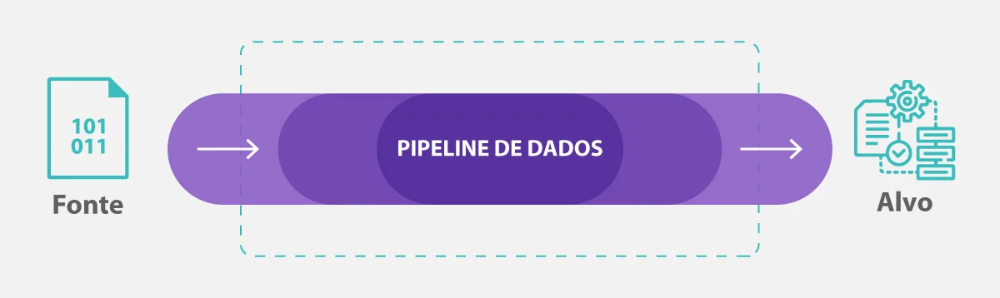

## 1\. **Introdução**

Neste notebook, é detalhado o processo de desenvolvimento de um fluxo de dados direcionado à captura, modificação e acesso às mensagens provenientes de grupos do Telegram. O propósito essencial deste projeto é a extração de dados pertinentes dos grupos do Telegram, viabilizando sua análise e recuperação por meio de soluções da AWS, tais como Amazon S3, Amazon Lambda e Amazon Athena.

Nesse projeto serão apresentadas as mensagens captadas por um bot no Telegram através da API web, e fornecido no formato JSON. Será feito a Ingestão com os serviços do AWS que forneça uma API web para receber dados redirecionados, os dados são manipulados na ETL. E por fim, será a etapa de apresentação para analisar os dados, que serão essenciais para tomadas de decisões de negócios.

## 2\. **O que é Pipeline de Dados?**

O pipeline de dados é uma terminologia que abrange a organização de objetos, a extração, regulamentação e roteamento de dados para um sistema, de forma que possibilita a extração de informações valiosas para o negócio.

- **Por que a Pipeline de Dados é valiosa para um negócio?**

O propósito é gerar inteligência para o negócio. Quando bem trabalhados, os dados podem resultar em insights para o dia a dia da empresa. O pipeline de dados permite que dados de fontes diferentes sejam integrados com eficiência.

Por meio dele, é possível analisar dados relativos ao comportamento do cliente-alvo, que pode ser o consumidor final, automação de processos, jornadas do comprador e experiências do cliente. Em uma economia tecnológica como a de hoje e altamente competitiva, essa inteligência não pode ser descartada, sendo, na realidade, indispensável para os negócios.

###**Então vamos para o nosso projeto!**

## 3\. **Contexto**

### **3.1. Chatbot**

Um **chatbot** é um tipo de software que interage com usuários através de conversas automatizadas em plataformas de mensagens. Uma aplicação comum de **chatbots** é o seu uso no atendimento ao cliente, onde, de maneira geral, ajudam clientes a resolver problemas ou esclarecer dúvidas recorrentes antes mesmo que um atendente humano seja acionado.

### **3.2. Telegram**

**Telegram** é uma plataforma de mensagens instantâneas *freeware* (distribuído gratuitamente) e, em sua maioria, *open source*. É muito popular entre desenvolvedores por ser pioneiro na implantação da funcionalidade de criação de **chatbots**, que, por sua vez, permitem a criação de diversas automações.

### **3.3. Arquitetura**

Uma atividade analítica de interesse é a de realizar a análise exploratória de dados enviadas a um **chatbot** para responder perguntas como:

**1. Qual o horário que os usuários mais acionam o *bot*?**

**2. Qual o problema ou dúvida mais frequente?**

**3. O *bot* está conseguindo resolver os problemas ou esclarecer as dúvidas?**

**4. Etc.**

**Através de simples perguntas de negócios, é possível avaliar a qualidade do serviço oferecido ao cliente, para assim procurar soluções efetivas e eficazes, para cada questionamento levantado.**

Portanto, vamos construir um *pipeline* de dados que ingira, processe, armazene e exponha mensagens de um grupo do **Telegram** para que profissionais de dados possam realizar análises.

A arquitetura proposta é dividida em duas: transacional, no **Telegram**, onde os dados são produzidos, e analítica, na Amazon Web Services (AWS), onde os dados são analisados.

- **Desenho da Arquitetura**

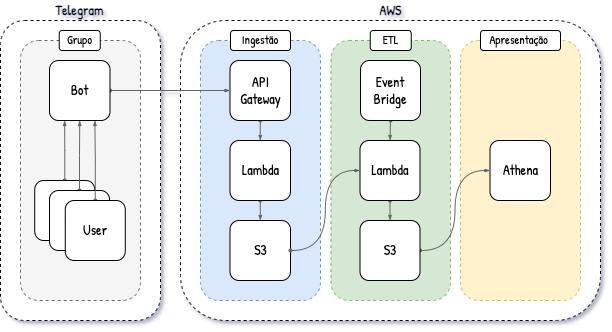

- **Passo a passo do desenho da arquitetura**

**Telegram:** O `Telegram` representa a fonte de dados transacionais. Mensagens enviadas por usuários em um grupo são capturadas por um *bot* e redirecionadas via *webhook* do *backend* do aplicativo para um *endpoint* (endereço *web* que aceita requisições HTTP) exposto pelo `AWS API Gateway`. As mensagens trafegam no corpo ou *payload* da requisição.

**AWS | Ingestão:** Uma requisição HTTP com o conteúdo da mensagem em seu *payload* é recebia pelo `AWS API Gateway` que, por sua vez, as redireciona para o `AWS Lambda`, servindo assim como seu gatilho. Já o `AWS Lambda` recebe o *payload* da requisição em seu parâmetro *event*, salva o conteúdo em um arquivo no formato JSON (original, mesmo que o *payload*) e o armazena no `AWS S3` particionado por dia.

**AWS | ETL:** Uma vez ao dia, o `AWS Event Bridge` aciona o `AWS Lambda` que processa todas as mensagens do dia anterior (atraso de um dia ou D-1), denormaliza o dado semi-estruturado típico de arquivos no formato JSON, salva o conteúdo processado em um arquivo no formato Apache Parquet e o armazena no `AWS S3` particionado por dia.

**AWS | Apresentação:** Por fim, uma tabela do `AWS Athena` é apontada para o *bucket* do `AWS S3` que armazena o dado processado: denormalizado, particionado e orientado a coluna. Profissionais de dados podem então executar consultas analíticas (agregações, ordenações, etc.) na tabela utilizando o SQL para a extração de *insights*.

## 4\. **Telegram**


O **Telegram** representa a fonte transacional de dados do nosso *pipeline* de dados. Nesta etapa, vamos criar um grupo, criar um **bot** e adiciona-lo ao grupo recém criado. O *bot* então captará **todas** as mensagens enviadas no grupo. As mensagens pode ser acessadas através da API (*application programming interface*) de *bots* dos **Telegram**

### **4.1. Criando o bot**

Primeiramente foi criado o Bot através do **BotFather**, que é uma funcionalidade do Telegram que ajuda o usuário a criar bots para gerencia-los. Logo após, nos é fornecido um código Token para acesso. Vale lembrar que o token de acesso deve sempre ficar salvo em um local seguro.

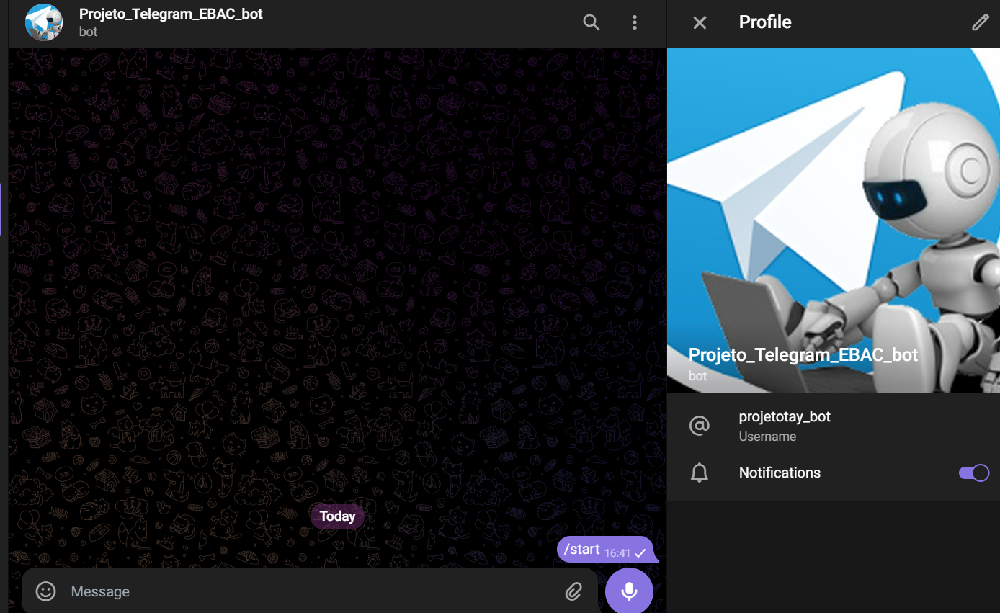

Depois foi criado um grupo do Projeto, então o Bot foi adicionado ao grupo.

**OBS: O bot precisa estar como um dos adiministradores do grupo, para que possa capturar as mensagens enviadas.**

**A opção de adicionar o bot a outros grupos também foi desabilitada, para que não haja nenhuma interferencia na condução do projeto. Tal configuração foi feita através do BotFather, como mostra a imagem abaixo.**

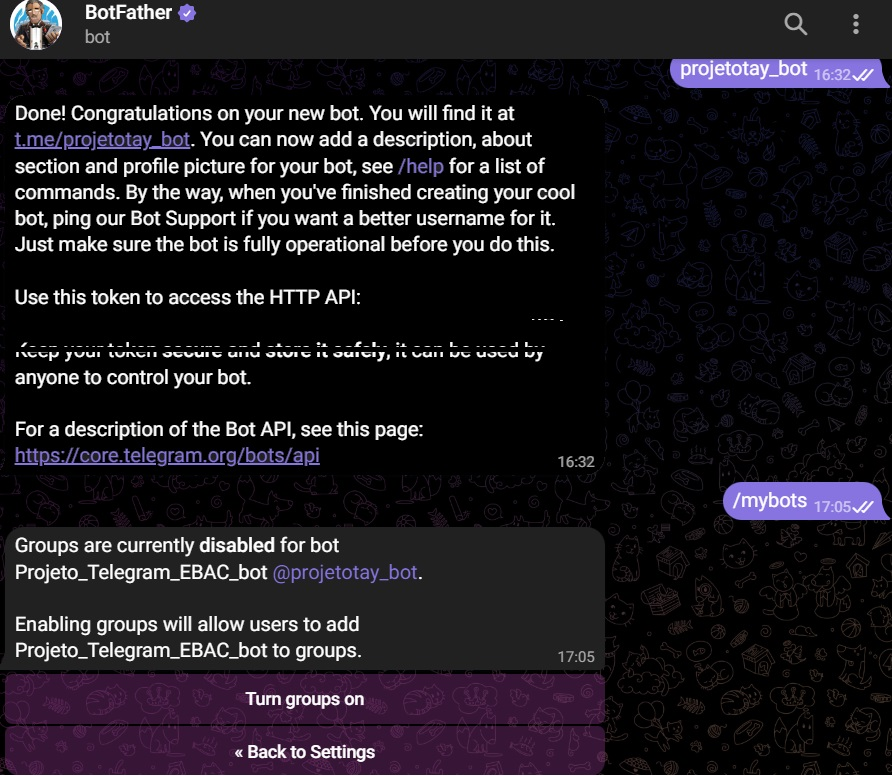

**Com tudo pronto, foram enviadas algumas mensagens no grupo.**

### **4.2. Bot API**

As mensagens captadas por um *bot* podem ser acessadas via API. A única informação necessária é o `token` de acesso fornecido pelo `BotFather` na criação do *bot*.

> **Nota:** A documentação completa da API pode ser encontrada neste [link](https://core.telegram.org/bots/api)

**A forma de interagir com o bot via API é através do token, logo vamos usar o código abaixo para o processo.**

**Nota: Lembrando que o token sempre deverá ficar oculto, pois ele funciona como uma senha de acesso, o método getpass nos da essa privacidade.**

In [15]:
#autenticando o token
from getpass import getpass

token = getpass()

··········


Com o código do token inserido, vamos buscar a URL. A `url` base é comum a todos os métodos da API.

In [16]:
import json

import requests

base_url = f'https://api.telegram.org/bot{token}'

- **getMe**

O método `getMe` retorna informações sobre o *bot*.

In [ ]:
response = requests.get(url=f'{base_url}/getMe')
print(f'{base_url}/getMe')

print(json.dumps(json.loads(response.text), indent=2))

https://api.telegram.org/bot6971972174:AAERrslieEEy-wYhlHTHsTAExNI8y5SC2Oc/getMe
{
  "ok": true,
  "result": {
    "id": 6971972174,
    "is_bot": true,
    "first_name": "Projeto_Telegram_EBAC_bot",
    "username": "projetotay_bot",
    "can_join_groups": false,
    "can_read_all_group_messages": false,
    "supports_inline_queries": false
  }
}


O método **getMe** nos confirma a conexão com o Bot criado através do token, onde aparece o primeiro nome e nome de usuário do Bot "Projeto_Telegram_EBAC_bot". Também nos é informado que o bot não pode ser adicionado em outros grupos, como foi confgurado anteriormente.

 - **getUpdates**  

O método getMe retorna as mensagens captadas pelo bot.

In [ ]:
response = requests.get(url=f'{base_url}/getUpdates')

print(json.dumps(json.loads(response.text), indent=2))

{
  "ok": true,
  "result": [
    {
      "update_id": 521402491,
      "message": {
        "message_id": 47,
        "from": {
          "id": 1192945743,
          "is_bot": false,
          "first_name": "Tayara",
          "last_name": "Jesus",
          "username": "TayaraJesus",
          "language_code": "pt-br"
        },
        "chat": {
          "id": -1002054787162,
          "title": "Projeto Final EBAC Group",
          "type": "supergroup"
        },
        "date": 1701980609,
        "text": "Oiiiii boa tarde"
      }
    },
    {
      "update_id": 521402492,
      "message": {
        "message_id": 48,
        "from": {
          "id": 920700958,
          "is_bot": false,
          "first_name": "M\u00e1rcio",
          "last_name": "Fontes",
          "username": "omarciofontes"
        },
        "chat": {
          "id": -1002054787162,
          "title": "Projeto Final EBAC Group",
          "type": "supergroup"
        },
        "date": 1701983052,
        "

## 5\. **Mensagem**

Uma mensagem recuperada via API é um dado semi-estruturado no formato JSON com algumas chaves mandatórias e diversas chaves opcionais, estas últimas presentes (ou não) dependendo do tipo da mensagem. Por exemplo, mensagens de texto apresentam a chave `text` enquanto mensagens de áudio apresentam a chave `audio`.

**Neste projeto vamos focar em mensagens do tipo texto, ou seja, vamos ingerir as chaves mandatórias e a chave `text`.**

> **Nota**: A lista completa das chaves disponíveis pode ser encontrada na documentação neste [link](https://core.telegram.org/bots/api#message).

 - Exemplo:

In [ ]:
%%writefile telegram.json
{
    "update_id": 123,
    "message": {
        "message_id": 1,
        "from": {
            "id": 321,
            "is_bot": false,
            "first_name": "Tayara"
        },
        "chat": {
            "id": -2054787162,
            "type": "group"
        },
        "date": 1640995200,
        "text": "Ola, mundo!"
    }
}

Writing telegram.json


## 6\. **Ingestão**  

A etapa de **ingestão** é responsável, como seu o próprio nome diz, pela ingestão dos dados transacionais em ambientes analíticos. De maneira geral, o dado ingerido é persistido no formato mais próximo do original, ou seja, nenhuma transformação é realizada em seu conteúdo ou estrutura (*schema*). Como exemplo, dados de uma API *web* que segue o formato REST (*representational state transfer*) são entregues, logo, persistidos, no formato JSON.

> **Persistir os dados em seu formato original trás muitas vantagens, como a possibilidade de reprocessamento.**

Pode ser conduzida de duas formas:

- **Batch**: blocos de dados são ingeridos em uma frequência bem definida, geralmente na escala de horas ou dias;
- **Streaming**: dados são ingeridos conforme são produzidos e disponibilizados.

No projeto, as mensagens capturadas pelo *bot* podem ser ingeridas através da API *web* de *bots* do **Telegram**, portanto são fornecidos no formato JSON. Como o **Telegram** retem mensagens por apenas 24h em seus servidores, a ingestão via **streaming** é a mais indicada. Para que seja possível esse tipo de **ingestão** seja possível, vamos utilizar um *webhook* (gancho *web*), ou seja, vamos redirecionar as mensagens automaticamente para outra API *web*.

Sendo assim, precisamos de um serviço da AWS que forneça um API *web* para receber os dados redirecionados, o `AWS API Gateway` (documentação neste [link](https://docs.aws.amazon.com/pt_br/apigateway/latest/developerguide/welcome.html)). Dentre suas diversas funcionalidades, o `AWS API Gateway` permite o redirecionamento do dado recebido para outros serviços da AWS. Logo, vamos conecta-lo ao `AWS Lambda`, que pode sua vez, irá armazenar o dado em seu formato original (JSON) em um *bucket* do `AWS S3`.

> Sistemas que reagem a eventos são conhecidos como *event-driven*.

 - Criar um *bucket* no `AWS S3`;
 - Criar uma função no `AWS Lambda`;
 - Criar uma API *web* no `AWS API Gateway`;
 - Configurar o *webhook* da API de *bots* do **Telegram**.

### **6.1. AWS S3**

Na etapa de **ingestão**, o `AWS S3` tem a função de passivamente armazenar as mensagens captadas pelo *bot* do **Telegram** no seu formato original: JSON. Para tanto, basta a criação de um *bucket*. Como padrão, vamos adicionar o sufixo `-raw` ao seu nome (vamos seguir esse padrão para todos os serviços desta camada).

> **Nota**: um `data lake` é o nome dado a um repositório de um grande volume dados. É organizado em zonas que armazenam replicadas dos dados em diferentes níveis de processamento. A nomenclatura das zonas varia, contudo, as mais comuns são: *raw* e *enriched* ou *bronze*, *silver* e *gold*.

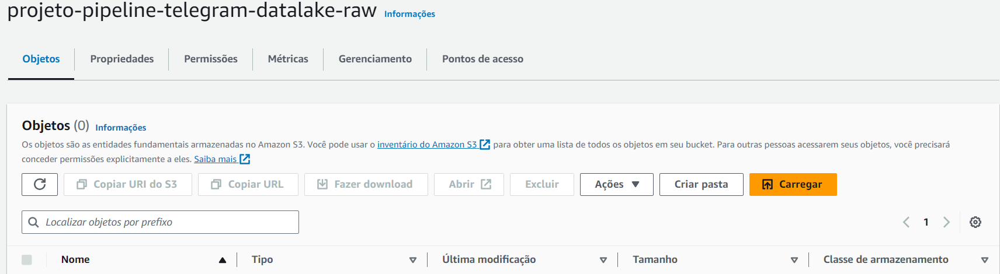

### **6.2. AWS Lambda**

Na etapa de **ingestão**, o `AWS Lambda` tem a função de ativamente persistir as mensagens captadas pelo *bot* do **Telegram** em um *bucket* do `AWS S3`. Para tanto vamos criar uma função que opera da seguinte forma:

 - Recebe a mensagem no parâmetro `event`;
 - Verifica se a mensagem tem origem no grupo do **Telegram** correto;
 - Persiste a mensagem no formato JSON no *bucket* do `AWS S3`;
 - Retorna uma mensagem de sucesso (código de retorno HTTP igual a 200) a API de *bots* do **Telegram**.

> **Nota**: No **Telegram**, restringimos a opção de adicionar o *bot* a grupos, contudo, ainda é possível iniciar uma conversa em um *chat* privado.

Vamos passar o código abaixo para uma função lambda que foi criada na AWS.

In [ ]:
import os
import json
import logging
from datetime import datetime, timezone, timedelta

import boto3


def lambda_handler(event: dict, context: dict) -> dict:

  '''
  Recebe uma mensagens do Telegram via AWS API Gateway, verifica no
  seu conteúdo se foi produzida em um determinado grupo e a escreve,
  em seu formato original JSON, em um bucket do AWS S3.
  '''

  # vars de ambiente

  BUCKET = os.environ['AWS_S3_BUCKET']
  TELEGRAM_CHAT_ID = int(os.environ['TELEGRAM_CHAT_ID'])

  # vars lógicas

  tzinfo = timezone(offset=timedelta(hours=-3))
  date = datetime.now(tzinfo).strftime('%Y-%m-%d')
  timestamp = datetime.now(tzinfo).strftime('%Y%m%d%H%M%S%f')

  filename = f'{timestamp}.json'

  # código principal

  client = boto3.client('s3')

  try:

    message = json.loads(event["body"])
    chat_id = message["message"]["chat"]["id"]

    if chat_id == TELEGRAM_CHAT_ID:

      with open(f"/tmp/{filename}", mode='w', encoding='utf8') as fp:
        json.dump(message, fp)

      client.upload_file(f'/tmp/{filename}', BUCKET, f'telegram/context_date={date}/{filename}')

  except Exception as exc:
      logging.error(msg=exc)
      return dict(statusCode="500")

  else:
      return dict(statusCode="200")

**Criação da função na AWS**

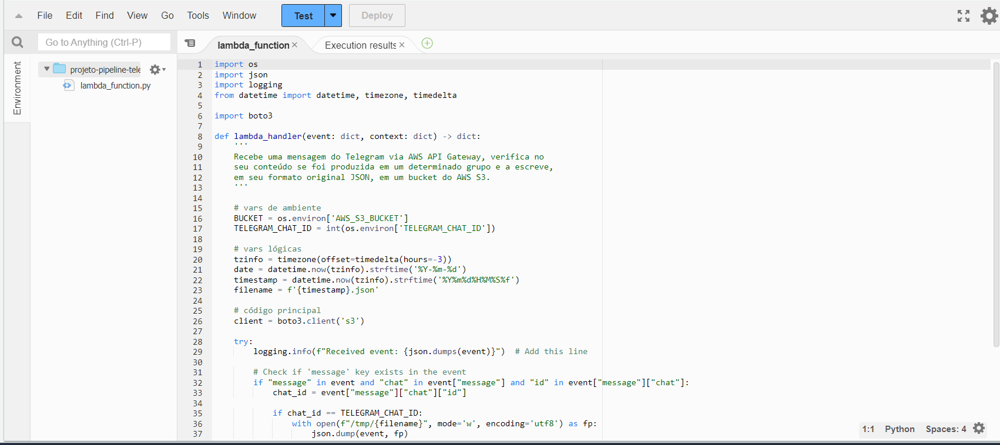

- **No teste do evento na função lambda, é necessário colocar uma parte das mensagens captados do GetUpdates no formato JSON:**

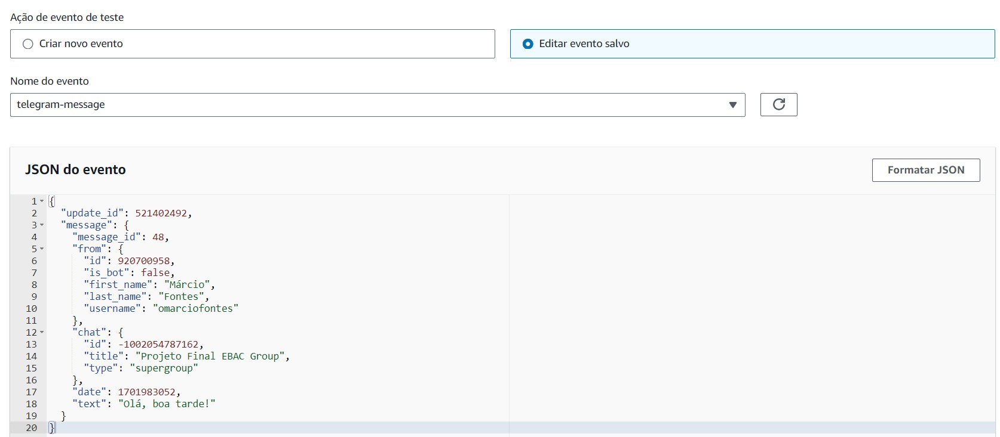

**Importante: Para que a função funcione corretamente, algumas configurações precisam ser realizadas.**

 - **Variáveis de ambiente**

Note que o código exige a configuração de duas variáveis de ambiente: `AWS_S3_BUCKET` com o nome do *bucket* do `AWS S3` e `TELEGRAM_CHAT_ID` com o id do *chat* do grupo do **Telegram**. Para adicionar variáveis de ambiente em uma função do `AWS Lambda`, basta acessar configurações -> variáveis de ambiente no console da função.

> **Nota**: Variáveis de ambiente são excelentes formas de armazenar informações sensíveis.

**Configurando as variáveis de ambiente na função Lambda criada na AWS:**

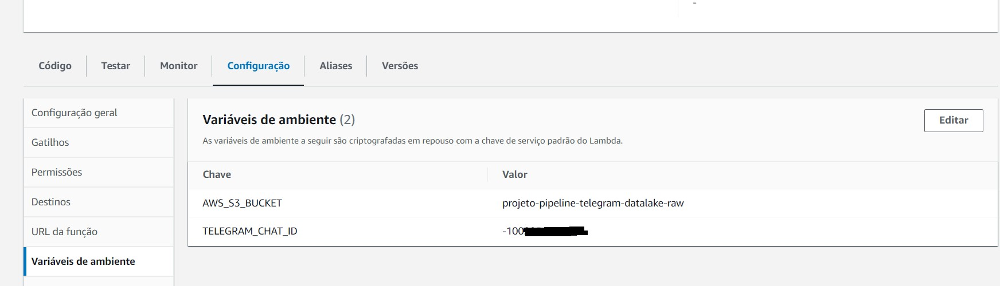

 - **Permissão**

Por fim, precisamos adicionar a permissão de escrita no *bucket* do `AWS S3` para a função do `AWS Lambda` no `AWS IAM`.

**Política anexada**

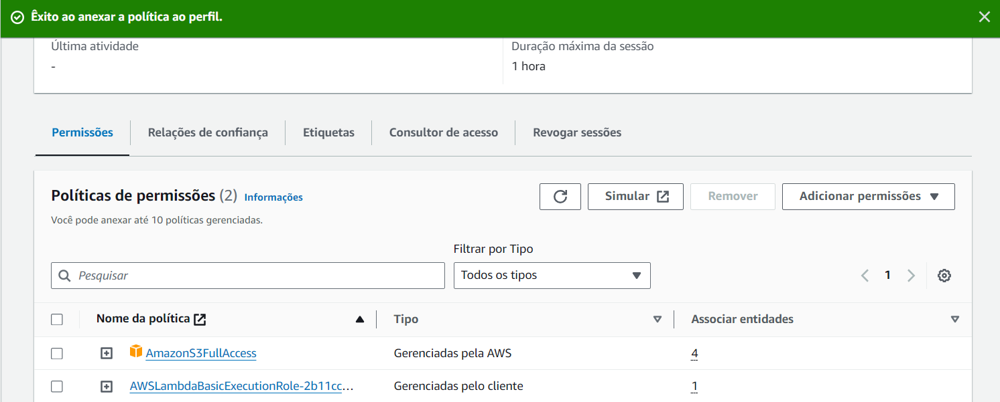

**Nota: Lembrando que esta permissão total foi concedida apenas para fins de aprendizado, recomenda-se restringir os acessos das funções aos buckets especificos no S3, em um ambiente empresarial.**

**Teste da função lambda**

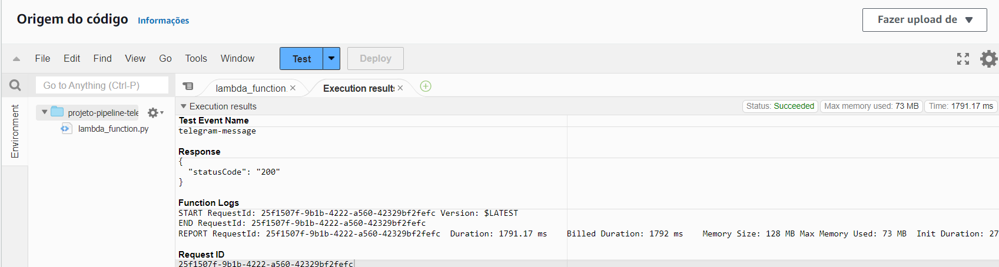

**Funcionou perfeitamente, voltando o resultado de statusCode 200!**

- **Dado armazenado no bucket do AWS S3 após a execução da função Lambda, no formato JSON:**

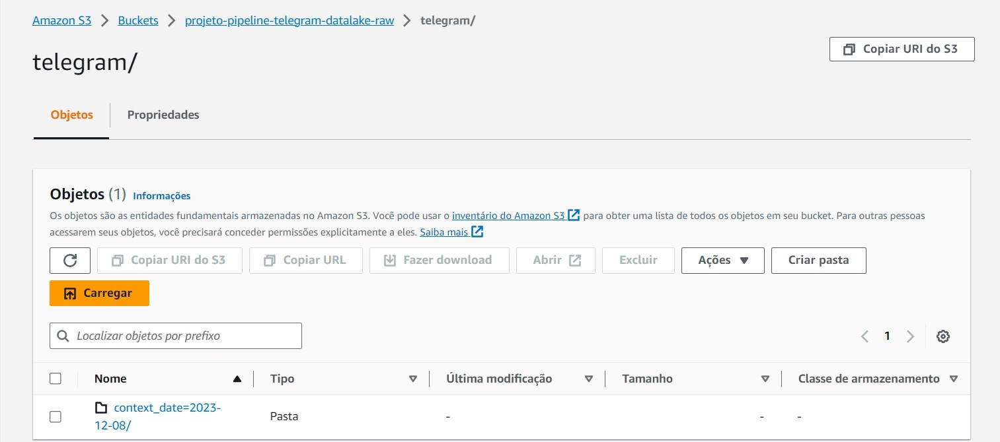

### **6.3. AWS API Gateway**

Na etapa de **ingestão**, o `AWS API Gateway` tem a função de receber as mensagens captadas pelo *bot* do **Telegram**, enviadas via *webhook*, e iniciar uma função do `AWS Lambda`, passando o conteúdo da mensagem no seu parâmetro *event*. Para tanto vamos criar uma API e configurá-la como gatilho da função do `AWS Lambda`:

 - Acesse o serviço e selecione: *Create API* -> *REST API*;
 - Insira um nome, como padrão, um que termine com o sufixo `-api`;
 - Selecione: *Actions* -> *Create Method* -> *POST*;
 - Na tela de *setup*:
  - Selecione *Integration type* igual a *Lambda Function*;
  - Habilite o *Use Lambda Proxy integration*;
  - Busque pelo nome a função do `AWS Lambda`.


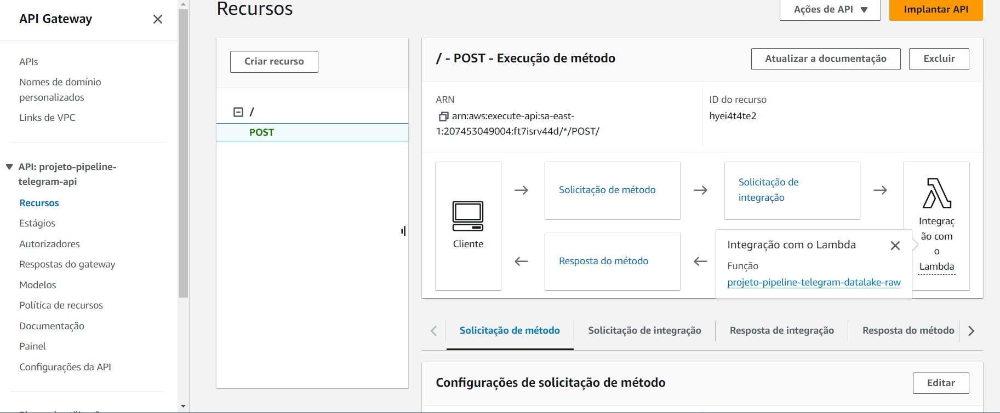

Podemos testar a integração com o `AWS Lambda` através da ferramenta de testes do serviço. Por fim, vamos fazer a implantação da API e obter o seu endereço *web*.

- **Teste**

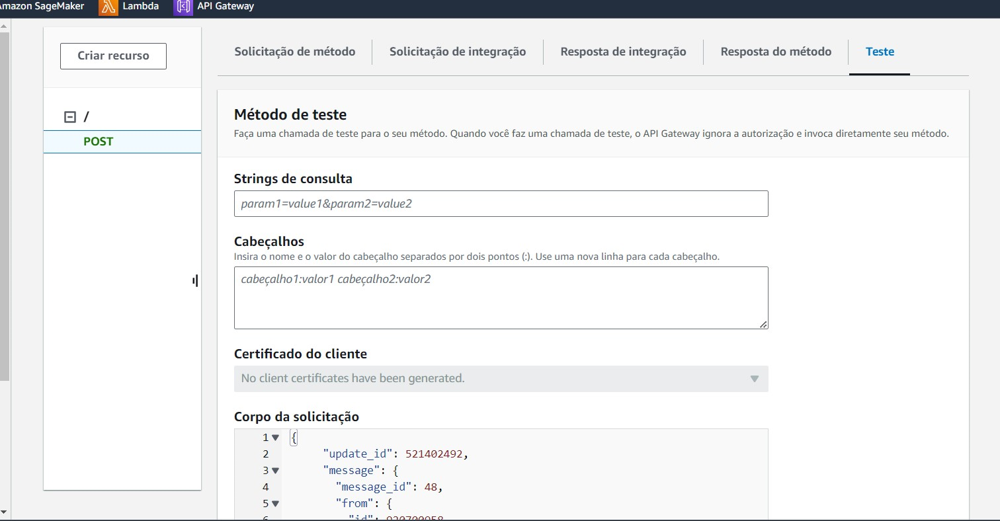

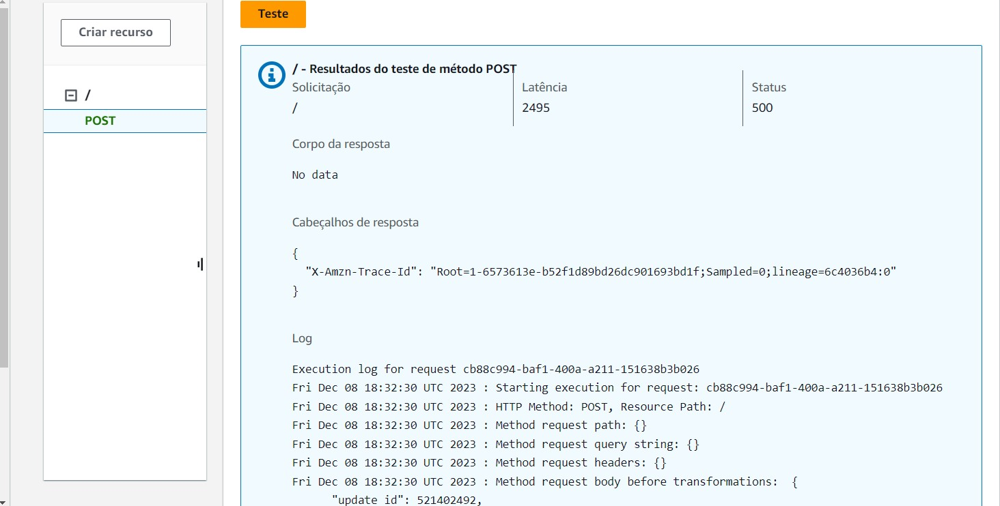

- **Implantação da API (deploy):**

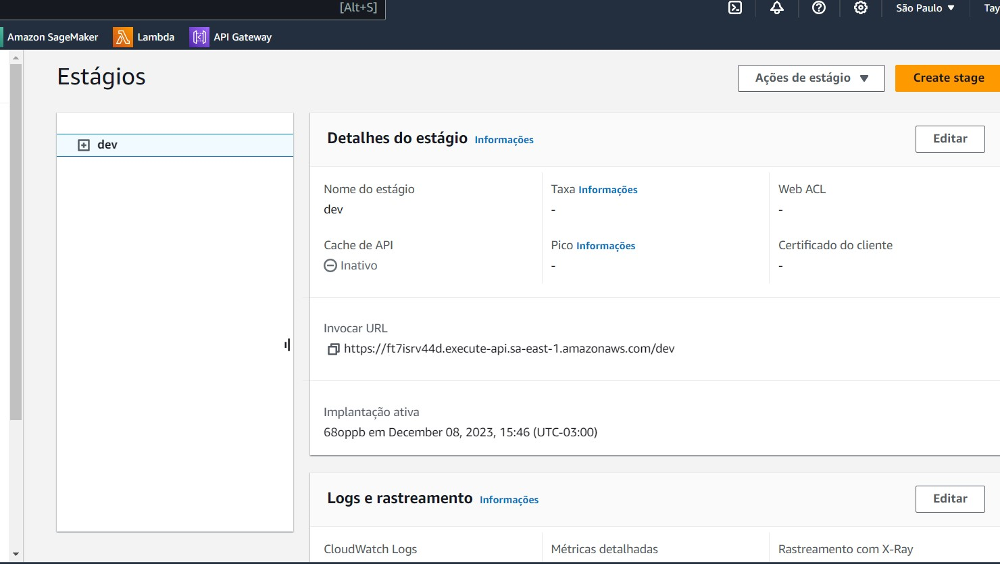

Copie o a `url` gerada na variável `aws_api_gateway_url`.



In [ ]:
aws_api_gateway_url = getpass()

··········


### **6.4. Telegram**

Vamos configurar o *webhook* para redirecionar as mensagens para a `url` do `AWS API Gateway`.

 - **setWebhook**

O método `setWebhook` configura o redirecionamento das mensagens captadas pelo *bot* para o endereço *web* do paramametro `url`.

> **Nota**: os métodos `getUpdates` e `setWebhook` são mutualmente exclusivos, ou seja, enquanto o *webhook* estiver ativo, o método `getUpdates` não funcionará. Para desativar o *webhook*, basta utilizar o método `deleteWebhook`

In [ ]:
response = requests.get(url=f'{base_url}/setWebhook?url={aws_api_gateway_url}')

print(json.dumps(json.loads(response.text), indent=2))

{
  "ok": true,
  "result": true,
  "description": "Webhook was set"
}


 - **getWebhookInfo**

O método `getWebhookInfo` retorna as informações sobre o *webhook* configurado.

In [ ]:
response = requests.get(url=f'{base_url}/getWebhookInfo')

print(json.dumps(json.loads(response.text), indent=2))

{
  "ok": true,
  "result": {
    "url": "https://ft7isrv44d.execute-api.sa-east-1.amazonaws.com/dev",
    "has_custom_certificate": false,
    "pending_update_count": 0,
    "max_connections": 40,
    "ip_address": "18.229.87.213"
  }
}


## 7\. **ETL - (Extraction, transformation and load)**

A etapa de **extração, transformação e carregamento** (do inglês *extraction, transformation and load* ou **ETL**) é uma etapa abrangente responsável pela manipulação dos dados ingeridos de sistemas transacionais, ou seja, já persistidos em camadas cruas ou *raw* de sistemas analíticos. Os processos conduzidos nesta etapa variam bastante de acordo com a área da empresa, do volume/variedade/velocidade do dado consumido, etc. Contudo, em geral, o dado cru ingerido passa por um processo recorrente de *data wrangling* onde o dado é limpo, deduplicado, etc. e persistido com técnicas de particionamento, orientação a coluna e compressão. Por fim, o dado processado está pronto para ser analisado por profissionais de dados.

No projeto, as mensagens de um único dia, persistidas na camada cru, serão compactas em um único arquivo, orientado a coluna e comprimido, que será persistido em uma camada enriquecida. Além disso, durante este processo, o dado também passará por etapas de *data wrangling*.

Para isso, vamos utilizar uma função do `AWS Lambda` como motor de processamento e um *bucket* do `AWS S3` como camada enriquecida para a persistência do dado processado. Para garantir a recorrência, vamos configurar uma regra do `AWS Event Bridge` como gatilho diáro da função.

### **7.1. AWS S3**

Na etapa de **ETL**, o `AWS S3` tem a função de passivamente armazenar as mensagens processadas de um dia em um único arquivo no formato Parquet. Para tanto, basta a criação de um *bucket*. Como padrão, vamos adicionar o sufixo `-enriched`.

**Bucket criado para receber o arquivo processado no formato Apache Parquet:**

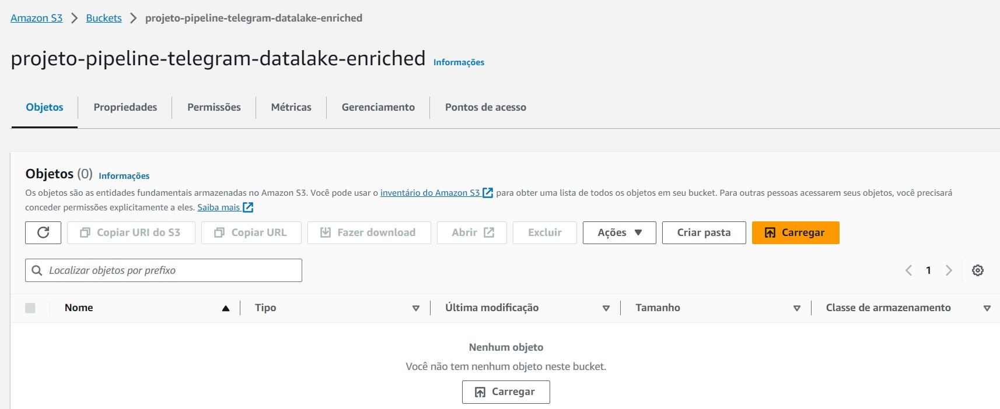

### **7.2. AWS Lambda** - VER SE DA PARA EXCLUIR ESSE TITULO

Na etapa de **ETL**, o `AWS Lambda` tem a função de ativamente processar as mensagens captadas pelo *bot* do **Telegram**, persistidas na camada cru no *bucket* do `AWS S3`, e persisti-las na camada enriquecida, também em um *bucket* do `AWS S3`. Logo, vamos criar uma função que opera da seguinte forma:

 - Lista todos os arquivos JSON de uma única participação da camada crua de um *bucket* do `AWS S3`;
 - Para cada arquivo listado:
  - Faz o *download* do arquivo e carrega o conteúdo da mensagem;
  - Executa uma função de *data wrangling*;
  - Cria uma tabela do PyArrow e a contatena com as demais.
 - Persiste a tabela no formato Parquet na camada enriquecida em um *bucket* do `AWS S3`.

> **Nota**: O fato de utilizarmos duas camadas de armazenamento e processamento, permite que possamos reprocessar os dados crus de diversas maneiras, quantas vezes forem preciso.

> **Nota: Atente-se ao fato de que a função processa as mensagens do dia anterior (D-1).**

O código da função:

In [ ]:
#pacotes e bibliotecas
import os
import json
import logging
from datetime import datetime, timedelta, timezone

import boto3
import pyarrow as pa
import pyarrow.parquet as pq


def lambda_handler(event: dict, context: dict) -> bool:

  '''
  Diariamente é executado para compactar as diversas mensagensm, no formato
  JSON, do dia anterior, armazenadas no bucket de dados cru, em um único
  arquivo no formato PARQUET, armazenando-o no bucket de dados enriquecidos
  '''

  # vars de ambiente

  RAW_BUCKET = os.environ['AWS_S3_BUCKET']
  ENRICHED_BUCKET = os.environ['AWS_S3_ENRICHED']

  # vars lógicas
  tzinfo = timezone(offset=timedelta(hours=-3))
  date = (datetime.now(tzinfo) - timedelta(days=1)).strftime('%Y-%m-%d')
  timestamp = datetime.now(tzinfo).strftime('%Y%m%d%H%M%S%f')

  # código principal

  table = None
  client = boto3.client('s3')

  try:

      response = client.list_objects_v2(Bucket=RAW_BUCKET, Prefix=f'telegram/context_date={date}')

      for content in response['Contents']:

        key = content['Key']
        client.download_file(RAW_BUCKET, key, f"/tmp/{key.split('/')[-1]}")

        with open(f"/tmp/{key.split('/')[-1]}", mode='r', encoding='utf8') as fp:

          data = json.load(fp)
          data = data["message"]

        parsed_data = parse_data(data=data)
        iter_table = pa.Table.from_pydict(mapping=parsed_data)

        if table:

          table = pa.concat_tables([table, iter_table])

        else:

          table = iter_table
          iter_table = None

      pq.write_table(table=table, where=f'/tmp/{timestamp}.parquet')
      client.upload_file(f"/tmp/{timestamp}.parquet", ENRICHED_BUCKET, f"telegram/context_date={date}/{timestamp}.parquet")

      return True

  except Exception as exc:
      logging.error(msg=exc)
      return False

O código da função de *data wrangling*:Junto ao código acima, temos que adicionar um laço de repetição para varrer todas as chaves do arquivo e selecionar apenas a text, que é a única de interesse deste projeto. Caso a mensagem não possua a chave text, ela será criada com o valor None.

In [ ]:
def parse_data(data: dict) -> dict:

  date = datetime.now().strftime('%Y-%m-%d')
  timestamp = datetime.now().strftime('%Y-%m-%d %H:%M:%S')

  parsed_data = dict()

  for key, value in data.items():

      if key == 'from':
          for k, v in data[key].items():
              if k in ['id', 'is_bot', 'first_name']:
                parsed_data[f"{key if key == 'chat' else 'user'}_{k}"] = [v]

      elif key == 'chat':
          for k, v in data[key].items():
              if k in ['id', 'type']:
                parsed_data[f"{key if key == 'chat' else 'user'}_{k}"] = [v]

      elif key in ['message_id', 'date', 'text']:
          parsed_data[key] = [value]

  if not 'text' in parsed_data.keys():
    parsed_data['text'] = [None]

  return parsed_data

- **Função Lambda criada na AWS (enriched):**

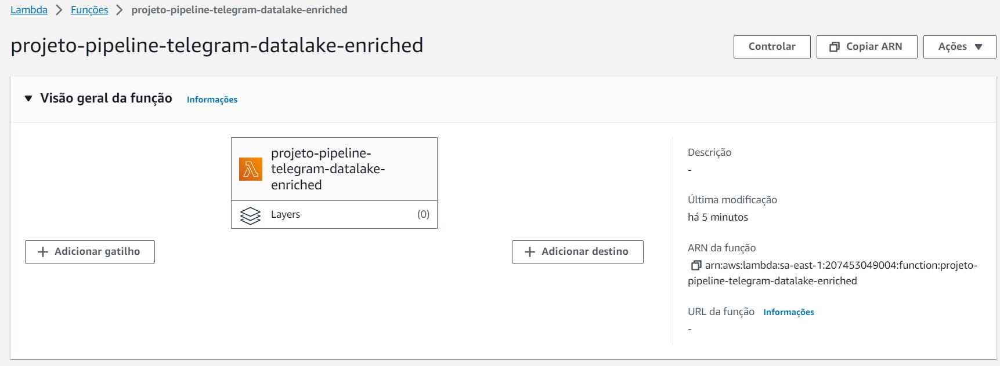

**Nota: O procedimento para as configurações de Variáveis de ambiente e Permissão foram feitas da mesma forma como foi mostrado na função anterior (projeto-pipeline-telegram-datalake-raw).**

- **Variáveis**

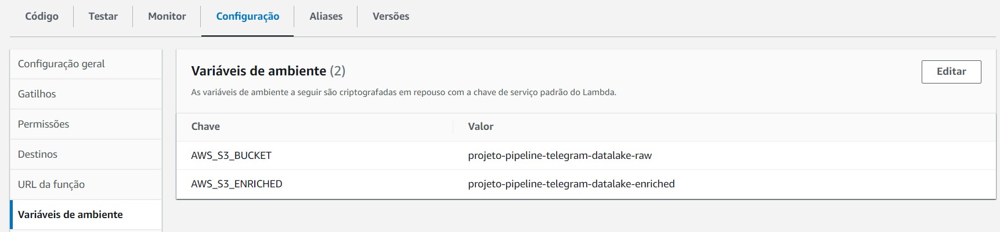

**Permissão**

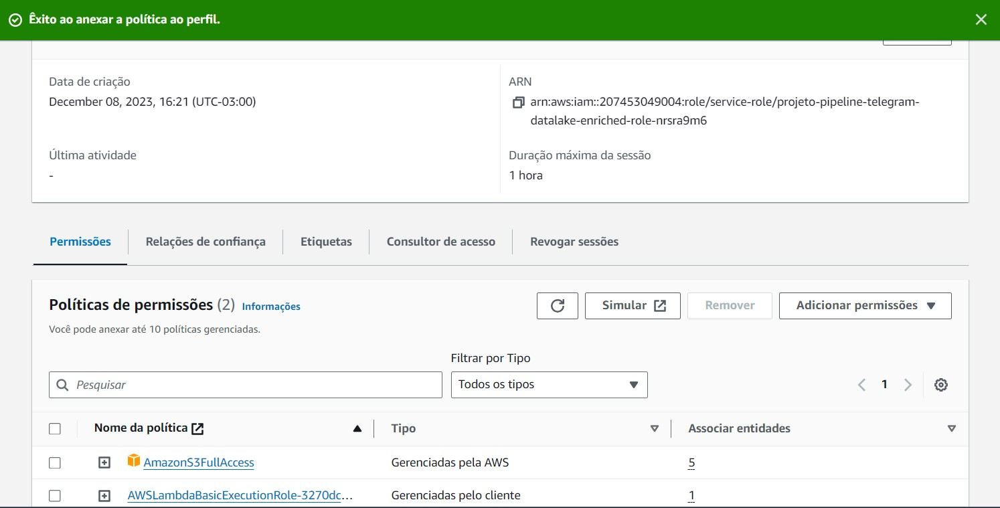

 - **Camadas**

Por fim, note que o código da função utiliza o pacote Python PyArrow. Contudo, o ambiente padrão do `AWS Lambda` possui poucos pacotes externos instalado, como o pacote Python boto3, logo o PyArrow não será encontrado e a execução da função falhará. Existem algumas formas de adicionar pacotes externos no ambiente de execução do AWS Lambda, um deles é a criação de camadas ou *layers*, onde podemos fazer o *upload* dos pacotes Python direto na plataforma ou através de um *bucket* do `AWS S3`. Vamos utilizar a última opção, criando um bucket no AWS S3, fazendo o upload do pacote Python do PyArrow, criando layer e conectando na função.

- **Bucket do S3 criado, e arquivo carregado:**

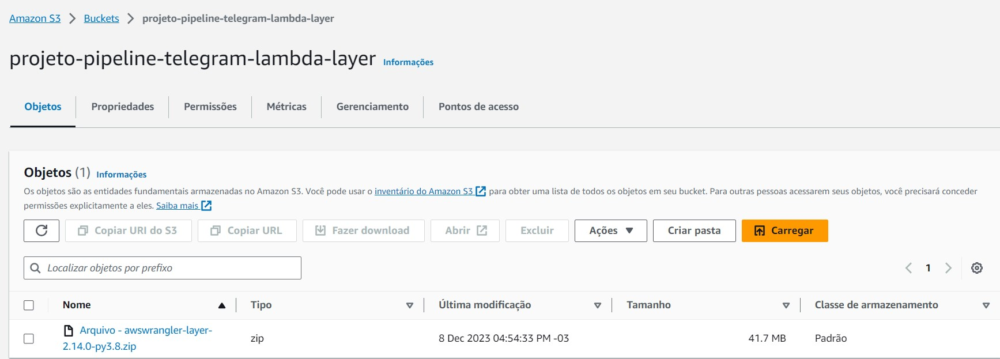

- **Versão da camada PyArrow criada:**

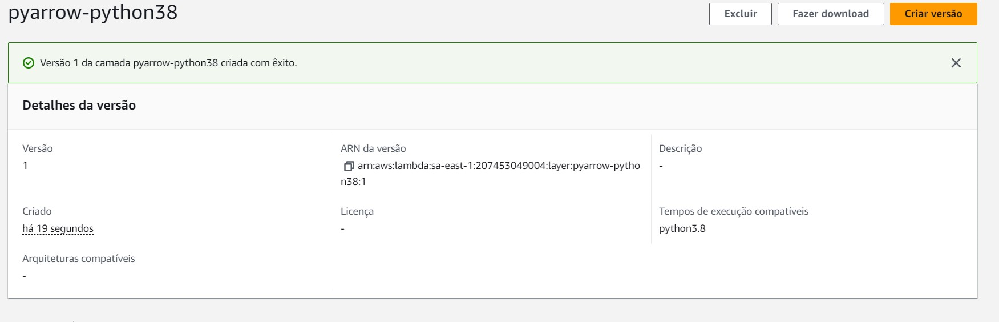

A edição da camada está sendo realizado para conectar a função do bucket S3 projeto-pipeline-telegram-datalake-enriched.

- Foi agendado para rodar sempre as 3 horas do dia:

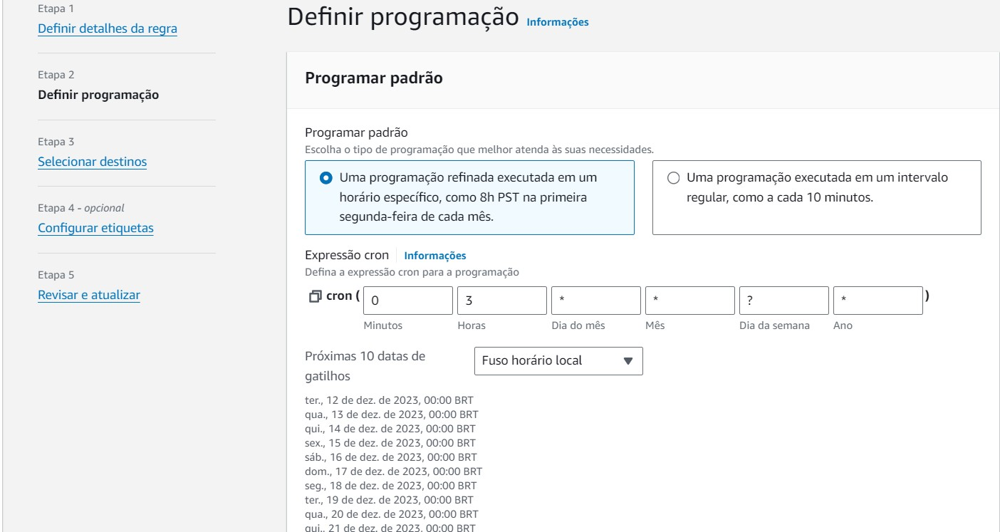

**Importante: O timeout padrão de funções do AWS Lambda é de 3 segundos, será aumentado para pouco mais de 1 minuto, pois com um tempo menor, provavelmente irá dar um erro, pois essa função precisa de mais tempo para execução:**

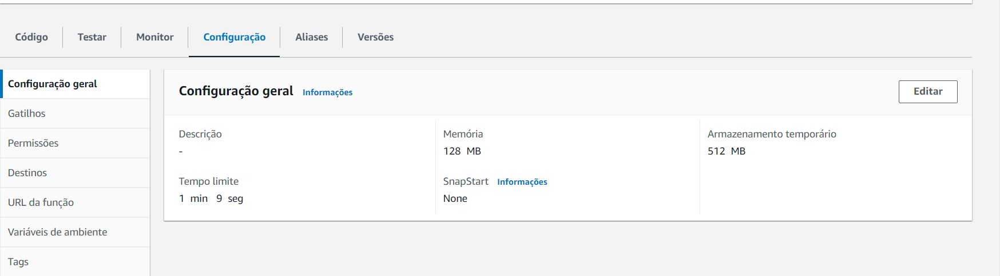

- **Função executada com sucesso:**

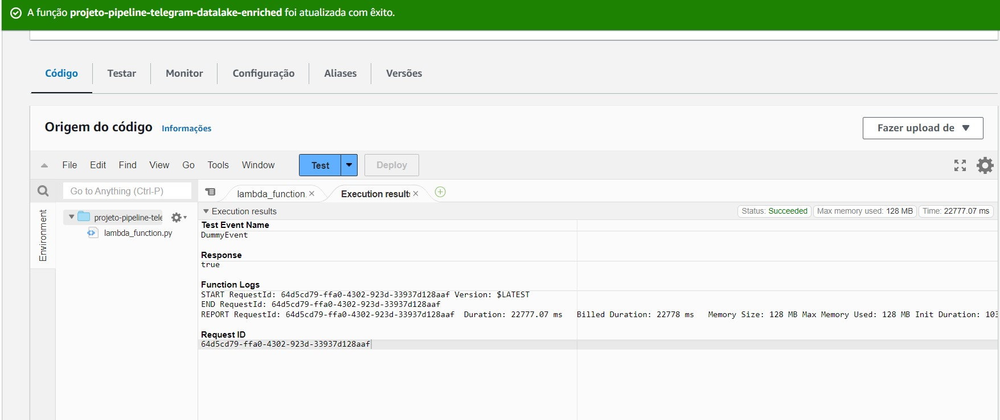

- **Arquivos carregados no bucket do S3 (enriched) no formato Parquet:**

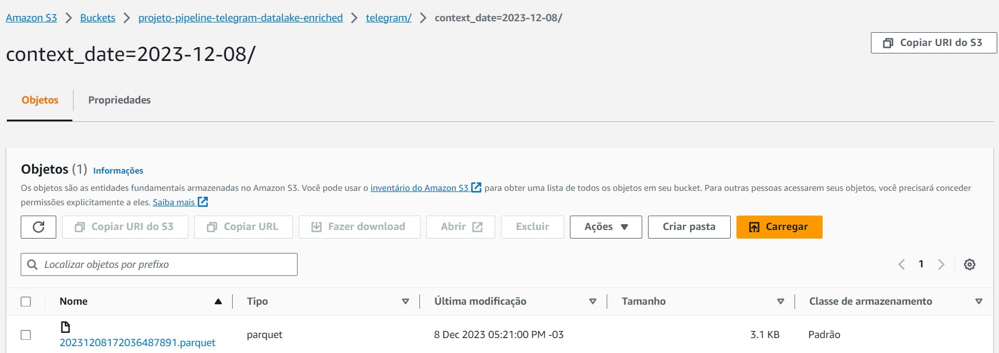

### **7.3. AWS Event Bridge**

Na etapa de **ETL**, o `AWS Event Bridge` tem a função de ativar diariamente a função de **ETL** do `AWS Lambda`, funcionando assim como um *scheduler*.

- **Regra criada**

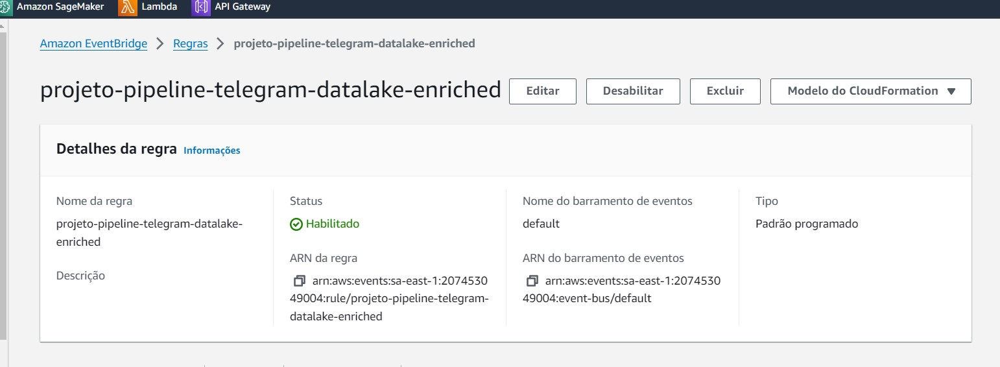

## 8\. **Apresentação**

A etapa de **apresentação** é reponsável por entregar o dado para os usuários (analistas, cientistas, etc.) e sistemas (dashboards, motores de consultas, etc.), idealmente através de uma interface de fácil uso, como o SQL, logo, essa é a única etapa que a maioria dos usuários terá acesso. Além disso, é importante que as ferramentas da etapa entregem dados armazenados em camadas refinadas, pois assim as consultas são mais baratas e o dados mais consistentes.

### **8.1. AWS Athena**

Na etapa de **apresentação**, o `AWS Athena` tem função de entregar o dados através de uma interface SQL para os usuários do sistema analítico. Para criar a interface, basta criar uma tabela externa sobre o dado armazenado na camada mais refinada da arquitetura, a camada enriquecida.

- **Criando a tabela Telegram no AWS Athena:**



Query: **CREATE EXTERNAL TABLE `telegram`(
  `message_id` bigint,
  `user_id` bigint,
  `user_is_bot` boolean,
  `user_first_name` string,
  `chat_id` bigint,
  `chat_type` string,
  `text` string,
  `date` bigint)
PARTITIONED BY (
  `context_date` date)
ROW FORMAT SERDE
  'org.apache.hadoop.hive.ql.io.parquet.serde.ParquetHiveSerDe'
STORED AS INPUTFORMAT
  'org.apache.hadoop.hive.ql.io.parquet.MapredParquetInputFormat'
OUTPUTFORMAT
  'org.apache.hadoop.hive.ql.io.parquet.MapredParquetOutputFormat'
LOCATION
  's3://projeto-pipeline-telegram-datalake-enriched/telegram/'**

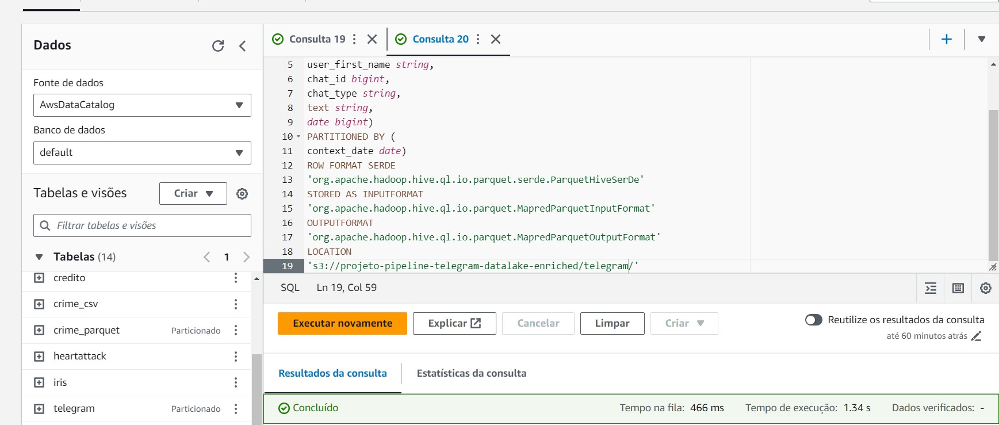

Por fim, adicione as partições disponíveis.

> **Importante**: Toda vez que uma nova partição é adicionada ao repositório de dados, é necessário informar o `AWS Athena` para que a ela esteja disponível via SQL.

Para isso digitamos a Query: **MSCK REPAIR TABLE `telegram`;**

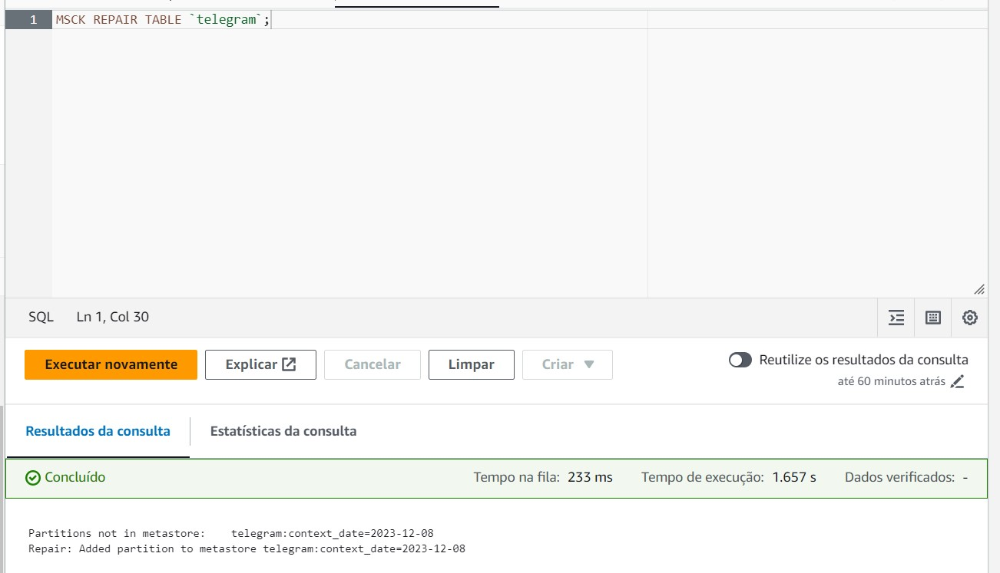

Consultando as 10 primeiras linhas para observar o resultado, para isso digitamos a Query: **SELECT * FROM `telegram` LIMIT 10;**

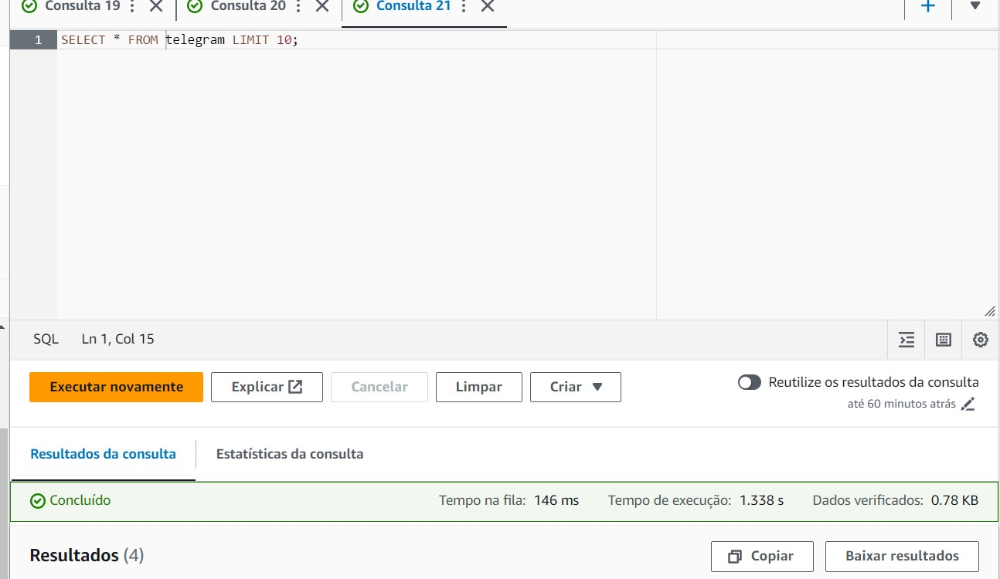

**Resultado:**

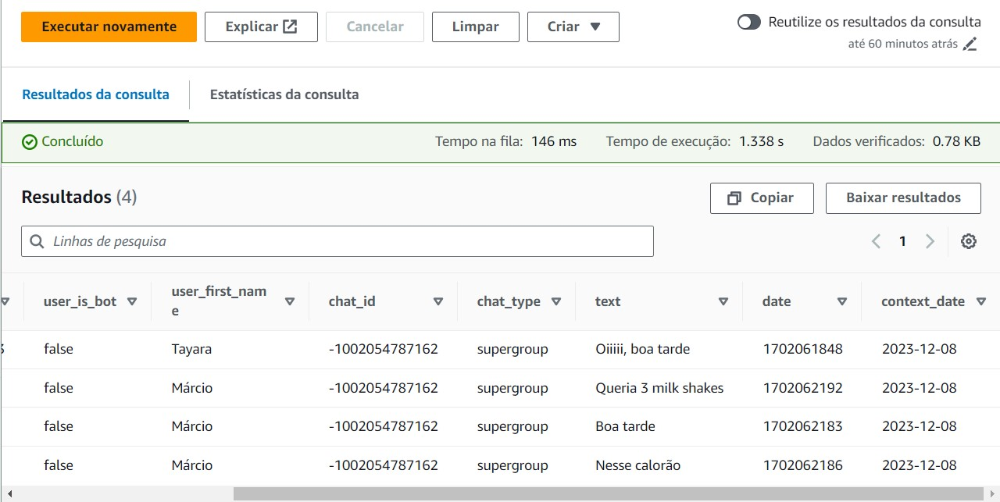

### **8.2. Analytics**

Com o dado disponível, o usuário podem executar as mais variadas consultas analíticas. Seguem alguns exemplos:

-  **Quantidade de mensagens por dia.**

Esta consulta nos permite saber quantas mensagens estamos recebendo por dia no chat.

Query: **SELECT
  context_date,
  count(1) AS "message_amount"
FROM "telegram"
GROUP BY context_date
ORDER BY context_date DESC**

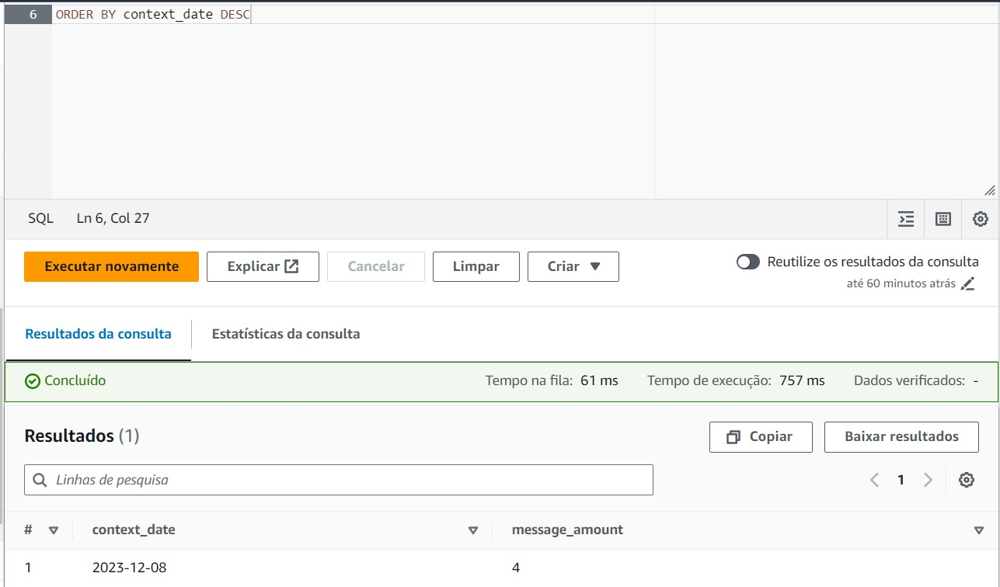

- **Quantidade de mensagens por usuário por dia.**

Saber a quantidade de mensagens que um determinado usuário manda por dia pode ser um bom direcionamento para que talvez, a empresa possa entrar em contato com esse usuário para resolver um eventual problema, ou dúvida, verificar se o usuário esta tendo alguma dificuldade em interagir com o bot.

Query:  **SELECT
  user_id,
  user_first_name,
  context_date,
  count(1) AS "message_amount"
FROM "telegram"
GROUP BY
  user_id,
  user_first_name,
  context_date
ORDER BY context_date DESC**

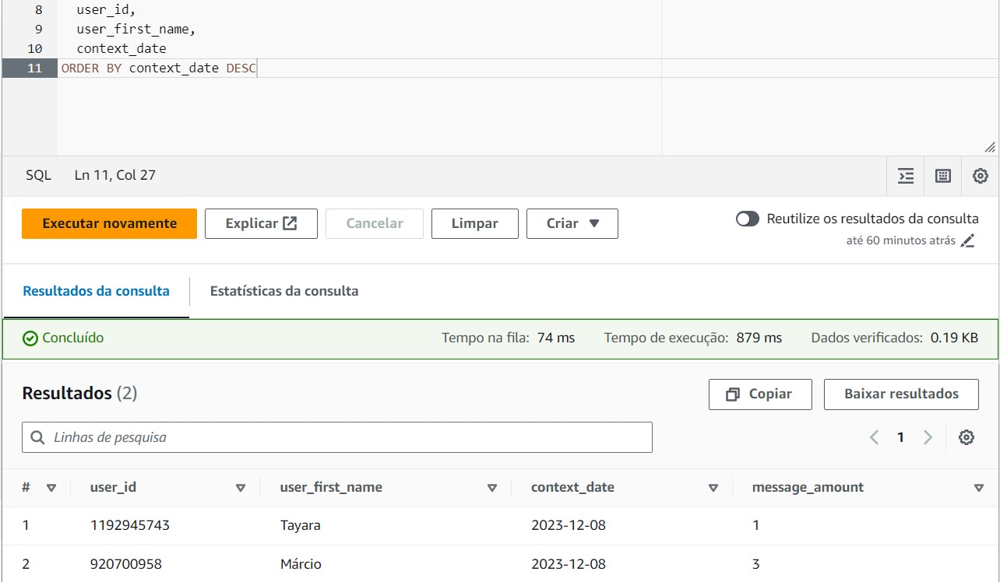

- **Média do tamanho das mensagens por usuário por dia.**

Dependendo do tamanho de média das mensagens dos usuários, se for muito grande, é bom observar, pois isso pode ser um indicativo de que talvez exista algum problema, já que o usuário expressa muitas palavras com o bot. Isso pode gerar inclusive mudanças nas configurações do bot para melhor atendimento com os clientes.

Query:  **SELECT
  user_id,
  user_first_name,
  context_date,
  CAST(AVG(length(text)) AS INT) AS "average_message_length"
FROM "telegram"
GROUP BY
  user_id,
  user_first_name,
  context_date
ORDER BY context_date DESC**

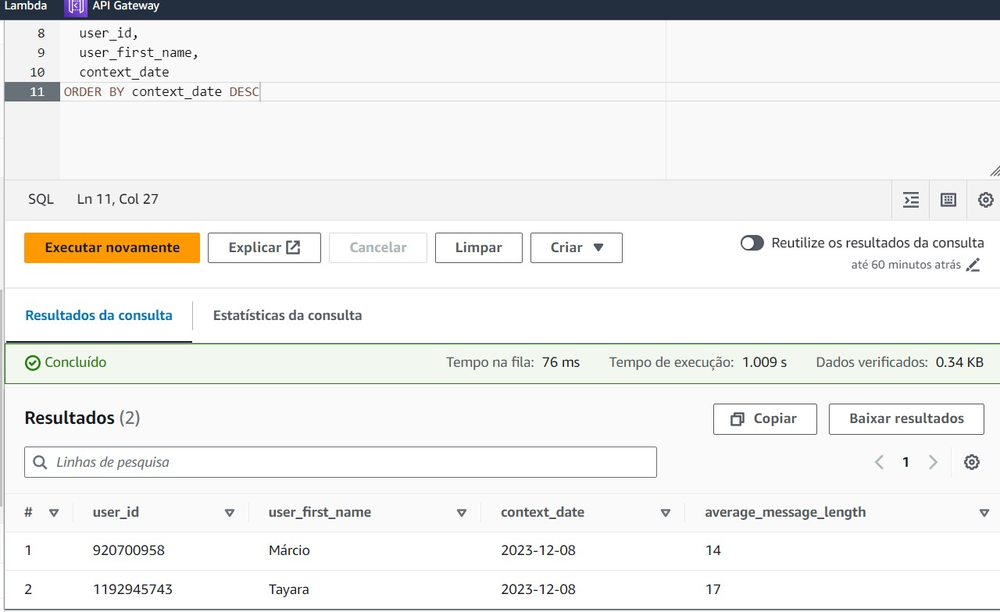

- **Quantidade de mensagens por hora por dia da semana por número da semana.**

Com essa consulta, é possível observar se existe alguma hora do dia, de algum dia especifico da semana, em que muitas mensagens estão sendo enviadas. Do porque que exatamente naquele horário ou dia especifico, chega muitas mensagens. Saber quando exatamente o cliente entra em contato com o bot, pode ajudar a empresa a alocar recursos, as vezes é necessário que a empresa coloque pessoas de plantão para determinado horário, o horário em que surge muitas dúvidas, ou outra demanda dos usuários.

Query: **WITH
parsed_date_cte AS (
    SELECT
        *,
        CAST(date_format(from_unixtime("date"),'%Y-%m-%d %H:%i:%s') AS timestamp) AS parsed_date
    FROM "telegram"
),
hour_week_cte AS (
    SELECT
        *,
        EXTRACT(hour FROM parsed_date) AS parsed_date_hour,
        EXTRACT(dow FROM parsed_date) AS parsed_date_weekday,
        EXTRACT(week FROM parsed_date) AS parsed_date_weeknum
    FROM parsed_date_cte
)
SELECT
    parsed_date_hour,
    parsed_date_weekday,
    parsed_date_weeknum,
    count(1) AS "message_amount"
FROM hour_week_cte
GROUP BY
    parsed_date_hour,
    parsed_date_weekday,
    parsed_date_weeknum
ORDER BY
    parsed_date_weeknum,
    parsed_date_weekday**

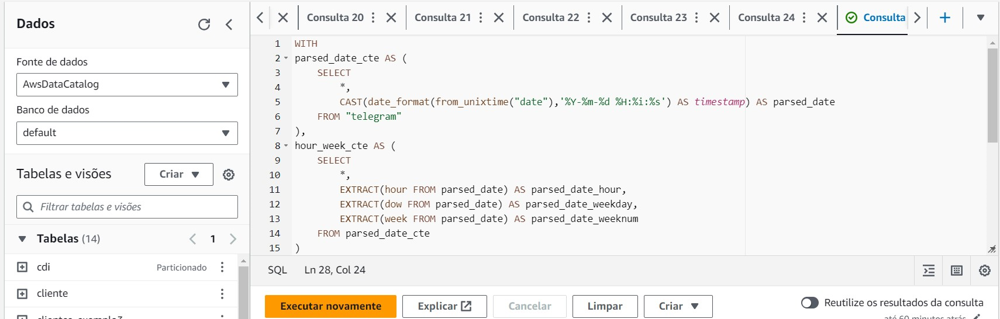

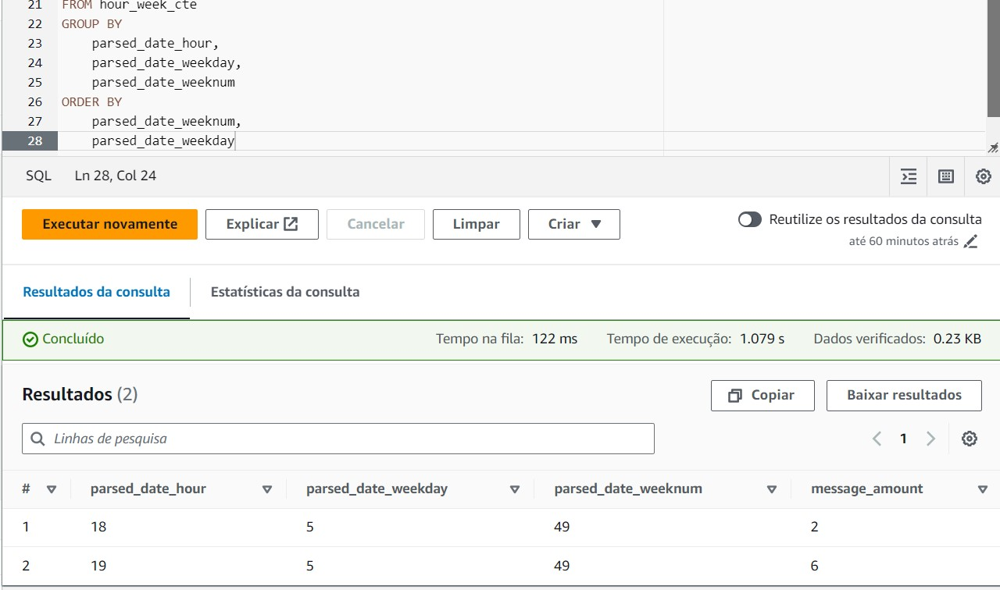

- *parsed_date_hour*: A hora "cheia" em que a mensagem aconteceu.

- *parsed_date_weekday*: O dia da semana em que houve as mensagens, a plataforma nos mostra um número que represente os dias da semana, no nosso exemplo o número 5, ou seja, as mensagens aconteceram na sexta feira. ( 1 -Segunda, 2 -terça, 3 - quarta, 4 - quinta, 5 - sexta, 6 - sábado, 7 - domingo.)

- *parsed_date_weeknum*: A contagem do número da semana no ano em que estamos.

- *message_amount*: Quantidade de mensagens.

## 9\. **Visualização com Gráficos e DataFrame**

Vamos praticar um pouco a visualização dos dados utilizando a biblioteca pandas e a biblioteca do seaborn.

Pela plataforma da AWS, é possível fazer o dowload dos dados em arquivo CSV, assim podemos obsevar também em dataframe, que os dados ficam armazenados de forma fácil, que simplifica a visualização e manipulação das informações pelos profissionais da área.

Basta clicar em baixar resultados, com as determinadas querys executadas. Vamos baixar os arquivos em CSV de querys já feitas, e colocar esses arquivos no ambiente do notebook.

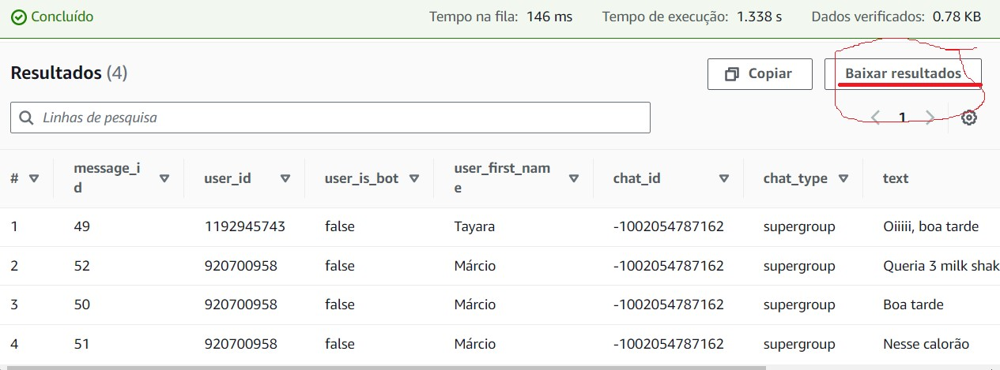

In [3]:
#carregando os resultados em um dataframe

import pandas as pd

telegram_12_08 = pd.read_csv('/content/telegram - 12-08.csv')
telegram_12_08.sort_values(by=['context_date'], ascending=False).head()


,message_id,user_id,user_is_bot,user_first_name,chat_id,chat_type,text,date,context_date
0,49,1192945743,False,Tayara,-1002054787162,supergroup,"Oiiiii, boa tarde",1702061848,2023-12-08
1,52,920700958,False,Márcio,-1002054787162,supergroup,Queria 3 milk shakes,1702062192,2023-12-08
2,50,920700958,False,Márcio,-1002054787162,supergroup,Boa tarde,1702062183,2023-12-08
3,51,920700958,False,Márcio,-1002054787162,supergroup,Nesse calorão,1702062186,2023-12-08


- Número de mensagens por usuário

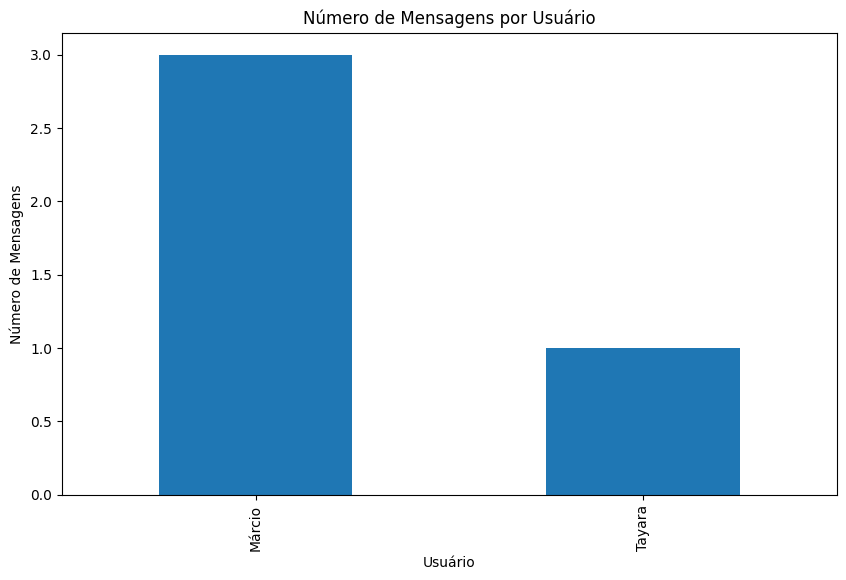

In [5]:
import matplotlib.pyplot as plt

# lendo o arquivo CSV
telegram_12_08 = pd.read_csv('/content/telegram - 12-08.csv')

# Contando o número de mensagens por usuário
messages_per_user = telegram_12_08['user_first_name'].value_counts()

# Plotando o gráfico de barras
plt.figure(figsize=(10, 6))
messages_per_user.plot(kind='bar')
plt.title('Número de Mensagens por Usuário')
plt.xlabel('Usuário')
plt.ylabel('Número de Mensagens')
plt.show()


- Qual a quantidade de mensagens recebidas por hora, por dia da semana, por número da semana no ano?

In [7]:
# carregando os resultados em um dataframe

parsed_date = pd.read_csv('/content/parsed_date.csv')
parsed_date.head()


,parsed_date_hour,parsed_date_weekday,parsed_date_weeknum,message_amount
0,18,5,49,2
1,19,5,49,6


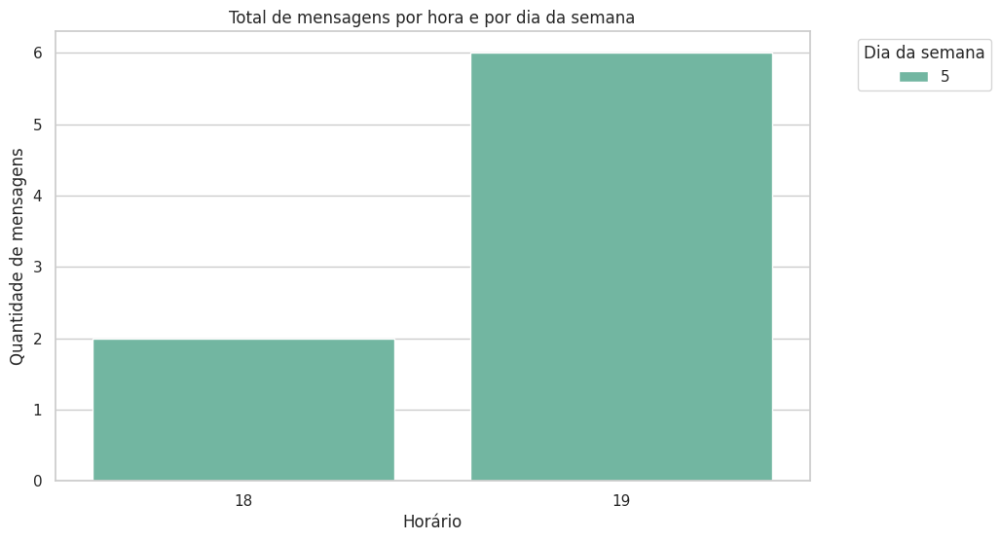

In [13]:
#construindo um gráfico de barras para visualização dos dados

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


parsed_date = pd.read_csv('/content/parsed_date.csv')

sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 6))
grafico = sns.barplot(data=parsed_date, x='parsed_date_hour', y='message_amount', hue='parsed_date_weekday', errorbar=None, palette='Set2')
grafico.set(title='Total de mensagens por hora e por dia da semana', xlabel='Horário', ylabel='Quantidade de mensagens')
grafico.legend(title='Dia da semana', loc='upper right', bbox_to_anchor=(1.25, 1.0))

plt.show()


- Qual a média do tamanho das mensagens que os usuários enviam por dia?

In [10]:
#carregando os dados em um dataframe

media_tamanho_msgs = pd.read_csv('/content/media_tamanho_msgs.csv')
media_tamanho_msgs.sort_values(by=['context_date'], ascending=False).head()

,user_id,user_first_name,context_date,average_message_length
0,920700958,Márcio,2023-12-08,14
1,1192945743,Tayara,2023-12-08,17


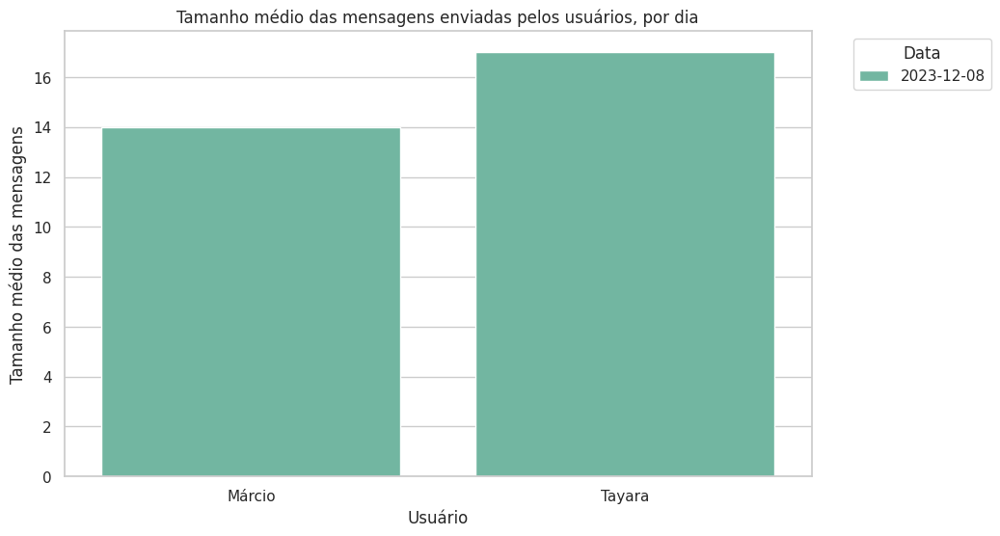

In [12]:
#grafico

media_tamanho_msgs = pd.read_csv('/content/media_tamanho_msgs.csv')
sns.set_theme(style='whitegrid')

plt.figure(figsize=(10, 6))
grafico = sns.barplot(data=media_tamanho_msgs, x='user_first_name', y='average_message_length', hue='context_date', palette='Set2')
grafico.set(title='Tamanho médio das mensagens enviadas pelos usuários, por dia', xlabel='Usuário', ylabel='Tamanho médio das mensagens')
grafico.legend(title='Data', loc='upper right', bbox_to_anchor=(1.25, 1.0))

plt.show()


## 10\. **Conclusão**

**Algumas conclusões:**

- A utilização de chatbots em conjunto com a análise de dados extraídos através de um pipeline traz benefícios significativos para empresas de todos os tamanhos;
- Os chatbots desempenham um papel fundamental ao facilitar a interação dos clientes com a empresa, permitindo que eles resolvam problemas e tirem dúvidas diretamente do seu smartphone ou computador, eliminando a necessidade de visitar uma loja física ou entrar em contato com um funcionário;

- Além disso, os dados obtidos a partir dessas interações são extremamente valiosos para os tomadores de decisão. Através de análises personalizadas, os gestores podem obter insights que vão desde o comportamento dos clientes até feedbacks e esclarecimentos sobre os produtos oferecidos. Essas informações fornecem uma visão aprofundada do mercado e permitem que a empresa tome decisões mais assertivas e estratégicas;

- Dessa forma, a combinação entre chatbots e análise de dados é uma poderosa ferramenta para melhorar a experiência do cliente, otimizar processos internos e impulsionar o crescimento das empresas em todos os setores!

> ### **Se quiser saber mais sobre a autora do projeto, basta acessar meu perfil no [linkedin!](https://www.linkedin.com/in/tayarajesus/)**

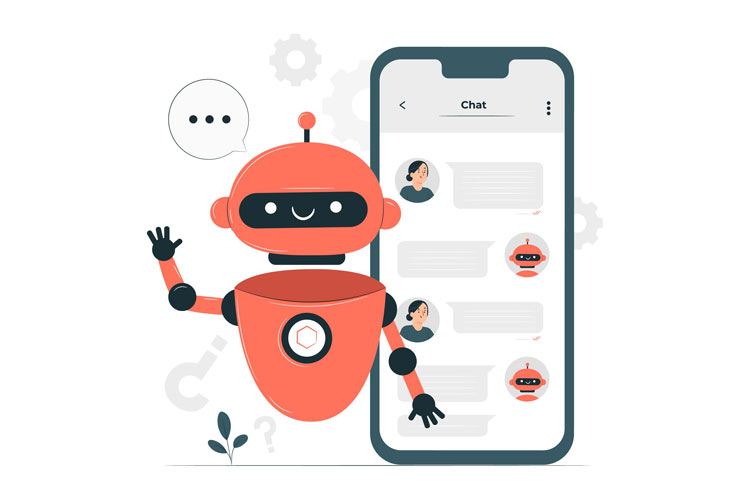